In [1]:
import pandas as pd
import tifffile
import numpy as np
from sklearn.model_selection import train_test_split
import os

import cv2  # Import OpenCV


# Define paths
excel_file_path = 'Merged_SNR_CNR2.xlsx'
base_dataset_dir = 'Dataset/AI images'

# Load the Excel file
xls = pd.ExcelFile(excel_file_path)

images = []  # List to store image data
targets = []  # List to store SNR and CNR as regression targets


# Define the target size for all images
target_size = (9, 9)  # Target size (width, height)


# Iterate over each sheet in the Excel file
for sheet_name in xls.sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet_name)
    print(f"Processing sheet: {sheet_name}")  # Announce the processing of a new sheet
    
    for index, row in df.iterrows():
        tif_path = os.path.join(base_dataset_dir, sheet_name, f"{row['StackNO']}.tif")
        print(f"Current folder: {os.path.join(sheet_name, row['StackNO'])}, Current image number: {row['imgNum']}")  # Print current processing info

        if not os.path.exists(tif_path):
            print(f"File not found: {tif_path}")
            continue
        
        try:
            with tifffile.TiffFile(tif_path) as tif:
                # Define image_index here to fix the undefined error
                image_index = row['imgNum'] - 1  
                if image_index < len(tif.pages):
                    img = tif.pages[image_index].asarray()
                    resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
                    images.append(img)  # Append the image array to the list
                    targets.append([row['SNR'], row['CNR']])  # Append SNR and CNR values as targets for regression
                    
                    print(f"Accessing {row['StackNO']}: imgNum {row['imgNum']}, Zero-based index in TIFF: {image_index}, SNR={row['SNR']}, CNR={row['CNR']}, Image Shape={img.shape}")
                else:
                    print(f"Image number {row['imgNum']} out of range for file {tif_path}")
        except Exception as e:
            print(f"Error processing file {tif_path}: {e}")

# Note: Images may have different shapes. Handle accordingly based on your model requirements.

# Since images might not be uniform in size, consider how you will handle them in your model
# Example of handling: Use list or preprocess images to uniform size depending on model requirements

#X_train, X_test, y_train, y_test = train_test_split(images, targets, test_size=0.2, random_state=42)

# print("Data preparation complete. Data is now ready for regression model training.")


Processing sheet: 70Kvp,215mAs,0.5s
Current folder: 70Kvp,215mAs,0.5s\Stack1, Current image number: 1
Accessing Stack1: imgNum 1, Zero-based index in TIFF: 0, SNR=-29.68250932689595, CNR=-904.6105226616197, Image Shape=(9, 9)
Current folder: 70Kvp,215mAs,0.5s\Stack2, Current image number: 1
Accessing Stack2: imgNum 1, Zero-based index in TIFF: 0, SNR=-17.93677878249026, CNR=-940.8126863584474, Image Shape=(9, 9)
Current folder: 70Kvp,215mAs,0.5s\Stack3, Current image number: 1
Accessing Stack3: imgNum 1, Zero-based index in TIFF: 0, SNR=-11.92664245625619, CNR=-923.7022825923135, Image Shape=(9, 9)
Current folder: 70Kvp,215mAs,0.5s\Stack4, Current image number: 1
Accessing Stack4: imgNum 1, Zero-based index in TIFF: 0, SNR=-10.32554263058258, CNR=-867.9073679856346, Image Shape=(9, 9)
Current folder: 70Kvp,215mAs,0.5s\Stack5, Current image number: 1
Accessing Stack5: imgNum 1, Zero-based index in TIFF: 0, SNR=-7.686170757836881, CNR=-855.142414588095, Image Shape=(9, 9)
Current folder:

In [4]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanAbsoluteError
import tensorflow as tf

# Assuming images have been resized to 9x9 and stored in `images`
# And corresponding targets (SNR, CNR) are stored in `targets`

# Convert images and targets list to numpy arrays
# This step assumes each image is already resized to 9x9. 
# If any image isn't, this will raise an error.
# Ensure every item is a numpy array and has the expected dimensions
images_processed = [img for img in images if isinstance(img, np.ndarray) and img.shape == (9, 9)]
X = np.array([img.reshape(9, 9, 1) for img in images_processed])

# Update your targets list accordingly
# This is a simplified example; you may need to track which items are being filtered out
targets_processed = [targets[i] for i, img in enumerate(images) if isinstance(img, np.ndarray) and img.shape == (9, 9)]
y = np.array(targets_processed)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


def r_squared(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - (ss_res / ss_tot)



In [5]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Cropping2D

# Example of building a simple autoencoder architecture
def build_autoencoder():
    input_img = Input(shape=(9, 9, 1))

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    
    # Decoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Cropping2D(cropping=((1, 0), (1, 0)))(x)
    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    
    return autoencoder


autoencoder = build_autoencoder()
autoencoder.summary()

# Add noise to your images to create a noisy dataset
noise_factor = 0.05
X_train_noisy = X_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train.shape)
X_test_noisy = X_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_test.shape)

# Ensure the noise is clipped between 0 and 1
X_train_noisy = np.clip(X_train_noisy, 0., 1.)
X_test_noisy = np.clip(X_test_noisy, 0., 1.)

# Train the autoencoder
autoencoder.fit(X_train_noisy, X_train,  # Using noisy images as input and clean images as target output
                epochs=100,
                batch_size=32,
                validation_data=(X_test_noisy, X_test))

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9, 9, 1)]         0         
                                                                 
 conv2d_3 (Conv2D)           (None, 9, 9, 32)          320       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 5, 5, 32)          9248      
                                                                 
 up_sampling2d_1 (UpSamplin  (None, 10, 10, 32)        0         
 g2D)                                                            
                                                                 
 cropping2d_1 (Cropping2D)   (None, 9, 9, 32)          0   

In [6]:
X_train_denoised = autoencoder.predict(X_train_noisy)
X_test_denoised = autoencoder.predict(X_test_noisy)

81/81 [==============================] - 0s 1ms/step


In [11]:
import kerastuner as kt
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

def build_model(hp):
    model = Sequential([
        Conv2D(filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
               kernel_size=hp.Choice('conv_1_kernel', values=[3, 5]),
               activation='relu',
               input_shape=(9, 9, 1),
               padding='same'),
        MaxPooling2D(2, 2),
        Dropout(rate=hp.Float('dropout_1_rate', min_value=0.0, max_value=0.5, step=0.05)),
        
        Conv2D(filters=hp.Int('conv_2_filter', min_value=32, max_value=128, step=16),
               kernel_size=hp.Choice('conv_2_kernel', values=[3, 5]),
               activation='relu',
               padding='same'),
        Dropout(rate=hp.Float('dropout_2_rate', min_value=0.0, max_value=0.5, step=0.05)),
        
        Flatten(),
        Dense(units=hp.Int('dense_units', min_value=64, max_value=256, step=32),
              activation='relu'),
        Dropout(rate=hp.Float('dropout_3_rate', min_value=0.0, max_value=0.5, step=0.05)),
        Dense(2)
    ])
    
    model.compile(optimizer=Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')),
                  loss='mean_squared_error',
                  metrics=[MeanAbsoluteError(), r_squared])
    
    return model

tuner = kt.RandomSearch(
    build_model,
    objective=kt.Objective('val_mean_absolute_error', direction='min'),
    max_trials=20,
    executions_per_trial=3,
    directory='my_dir',
    project_name='intro_to_kt'
)

tuner.search(X_train, y_train, epochs=20, validation_split=0.2, batch_size=32)

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = build_model(best_hps)
print("Best Hyperparameters Found:\n")

# Convolutional Layer 1
print(f"conv_1_filter: {best_hps.get('conv_1_filter')}")
print(f"conv_1_kernel: {best_hps.get('conv_1_kernel')}")

# Dropout 1
print(f"dropout_1_rate: {best_hps.get('dropout_1_rate')}")

# Convolutional Layer 2
print(f"conv_2_filter: {best_hps.get('conv_2_filter')}")
print(f"conv_2_kernel: {best_hps.get('conv_2_kernel')}")

# Dropout 2
print(f"dropout_2_rate: {best_hps.get('dropout_2_rate')}")

# Dense Layer
print(f"dense_units: {best_hps.get('dense_units')}")

# Dropout 3
print(f"dropout_3_rate: {best_hps.get('dropout_3_rate')}")

# Learning Rate
print(f"learning_rate: {best_hps.get('learning_rate')}")


Reloading Tuner from my_dir\intro_to_kt\tuner0.json
Best Hyperparameters Found:

conv_1_filter: 32
conv_1_kernel: 5
dropout_1_rate: 0.0
conv_2_filter: 48
conv_2_kernel: 3
dropout_2_rate: 0.30000000000000004
dense_units: 96
dropout_3_rate: 0.4
learning_rate: 0.0032222302570378875


In [19]:
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.optimizers import Adam

# Assuming `r_squared` is defined somewhere above

# Build the model with the optimal hyperparameters
model = Sequential([
    Conv2D(filters=best_hps.get('conv_1_filter'),
           kernel_size=best_hps.get('conv_1_kernel'),
           activation='relu',
           input_shape=(9, 9, 1),
           padding='same'),
    MaxPooling2D(2, 2),
    Dropout(rate=best_hps.get('dropout_1_rate')),
    Conv2D(filters=best_hps.get('conv_2_filter'),
           kernel_size=best_hps.get('conv_2_kernel'),
           activation='relu',
           padding='same'),
    Dropout(rate=best_hps.get('dropout_2_rate')),
    Flatten(),
    Dense(units=best_hps.get('dense_units'), activation='relu'),
    Dropout(rate=best_hps.get('dropout_3_rate')),
    Dense(2)  # Output layer for predicting SNR and CNR
])

# Compile the model with the optimal learning rate found
model.compile(optimizer=Adam(learning_rate=best_hps.get('learning_rate')),
              loss='mean_squared_error',
              metrics=[MeanAbsoluteError(), r_squared])

# Model summary to see the applied hyperparameters
model.summary()

# Finally, train your model with these optimized hyperparameters
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 9, 9, 32)          832       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 4, 4, 32)          0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 4, 4, 32)          0         
                                                                 
 conv2d_15 (Conv2D)          (None, 4, 4, 48)          13872     
                                                                 
 dropout_13 (Dropout)        (None, 4, 4, 48)          0         
                                                                 
 flatten_4 (Flatten)         (None, 768)               0         
                                                      

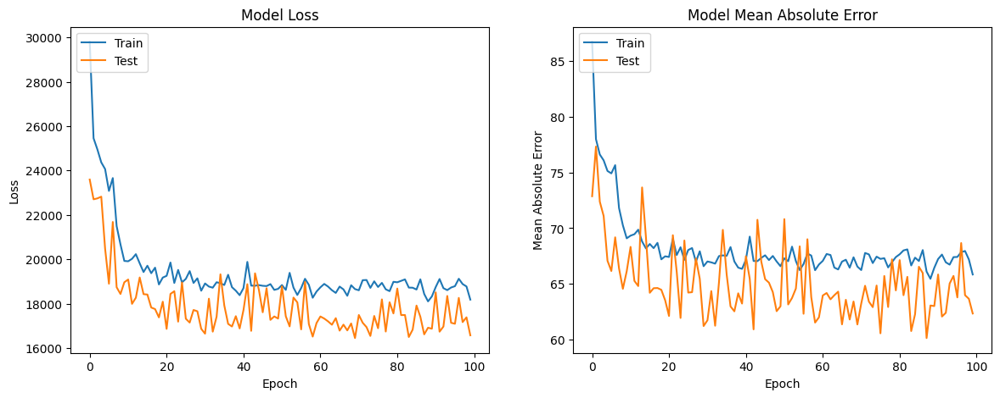

In [20]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation mean absolute error values
plt.subplot(1, 2, 2)
plt.plot(history.history['mean_absolute_error'])
plt.plot(history.history['val_mean_absolute_error'])
plt.title('Model Mean Absolute Error')
plt.ylabel('Mean Absolute Error')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.show()


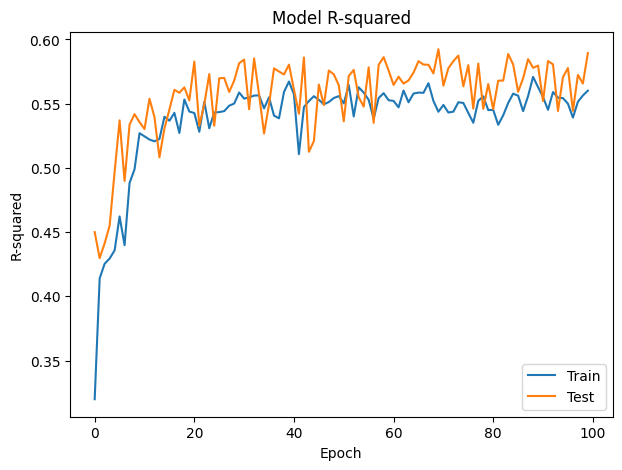

In [22]:
# Plot training & validation R-squared values
plt.figure(figsize=(7, 5))
plt.plot(history.history['r_squared'])
plt.plot(history.history['val_r_squared'])
plt.title('Model R-squared')
plt.ylabel('R-squared')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


In [32]:
# Dynamically find the last convolutional layer name
for layer in reversed(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name = layer.name
        break

print("Last convolutional layer name:", last_conv_layer_name)

Last convolutional layer name: conv2d_15


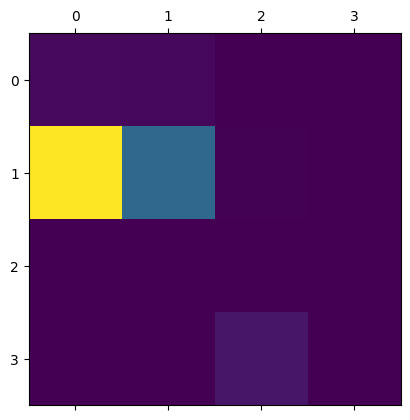

In [31]:
import matplotlib.pyplot as plt
import tensorflow as tf

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # The last layer output and model's output
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        # If `pred_index` is provided, use it; otherwise, focus on the first target (SNR)
        if pred_index is None:
            pred_index = 0
        loss = predictions[:, pred_index]

    # Gradient of the loss (for the selected prediction index) with respect to the conv layer output
    grads = tape.gradient(loss, conv_outputs)

    # Mean intensity of the gradient over the feature map channels
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight the convolution output with the computed gradient intensities
    conv_outputs = conv_outputs[0]
    pooled_grads = pooled_grads.numpy()
    conv_outputs = conv_outputs.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap
# Choose an image from X_test
img_array = X_test[0:1]  # Using the first image for demonstration
# Generate heatmap
last_conv_layer_name = 'conv2d_15'  # Ensure this is your model's last conv layer name
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()


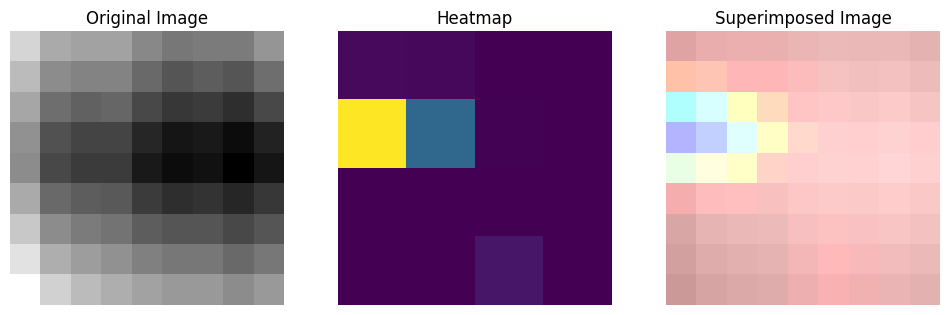

In [34]:
def superimpose_image_heatmap(img, heatmap):
    # Ensure the heatmap is in the range 0-1 for proper visualization
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    
    # Resize heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    
    # Convert heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    # Convert grayscale img to RGB for visualization
    img_rgb = np.repeat(img[..., np.newaxis], 3, axis=2)
    img_rgb = np.uint8(255 * img_rgb)  # Make sure the image is uint8
    
    # Superimpose the heatmap on image
    superimposed_img = heatmap * 0.4 + img_rgb
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    
    return superimposed_img

# Assuming the original image is normalized [0, 1] and reshaped to (9, 9)
original_img = img_array[0].reshape(9, 9)

# Generate the heatmap for the first image in your test set
heatmap = make_gradcam_heatmap(img_array[0:1], model, last_conv_layer_name)

# Superimpose the heatmap onto the original image
superimposed_img = superimpose_image_heatmap(original_img, heatmap)

# Visualization
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(original_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Heatmap')
plt.imshow(heatmap)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Superimposed Image')
plt.imshow(superimposed_img)
plt.axis('off')

plt.show()


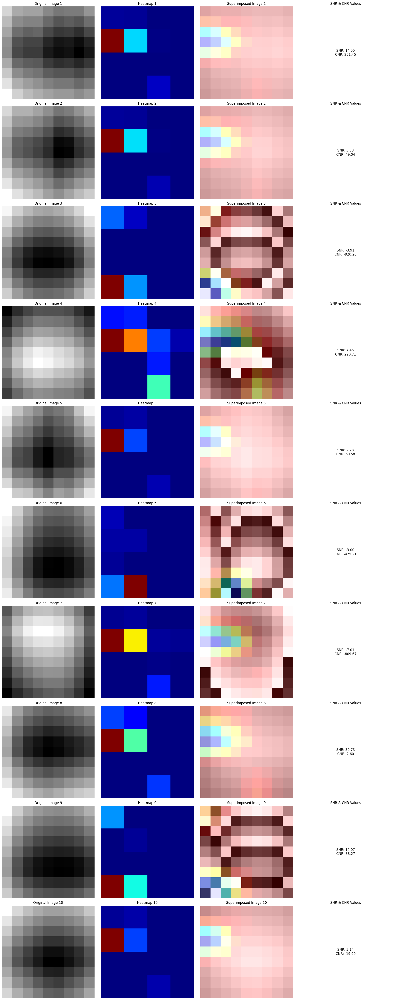

: 

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

# Assuming y_test holds the SNR and CNR values corresponding to each image in X_test
# Select the first 10 indices from X_test's length
first_ten_indices = np.arange(10)

# Setting up the plot
fig, axs = plt.subplots(10, 4, figsize=(20, 50))  # 10 images, 4 columns per image (including SNR and CNR values)

for i, idx in enumerate(first_ten_indices):
    img_array = X_test[idx:idx+1]  # Select the image by index
    original_img = img_array[0].reshape(9, 9)
    
    # Generate Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    
    # Superimpose the heatmap onto the original image
    superimposed_img = superimpose_image_heatmap(original_img, heatmap)
    
    # Original Image
    axs[i, 0].imshow(original_img, cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f'Original Image {idx+1}')
    
    # Heatmap
    axs[i, 1].imshow(heatmap, cmap='jet')
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f'Heatmap {idx+1}')
    
    # Superimposed Image
    axs[i, 2].imshow(superimposed_img)
    axs[i, 2].axis('off')
    axs[i, 2].set_title(f'Superimposed Image {idx+1}')
    
    # SNR and CNR Values
    snr, cnr = y_test[idx]
    axs[i, 3].axis('off')  # No image to display in this column, just text
    axs[i, 3].text(0.5, 0.5, f'SNR: {snr:.2f}\nCNR: {cnr:.2f}', 
                   horizontalalignment='center', verticalalignment='center',
                   fontsize=12, transform=axs[i, 3].transAxes)
    axs[i, 3].set_title(f'SNR & CNR Values')

plt.tight_layout()
plt.show()


Total images in TIFF file: 26


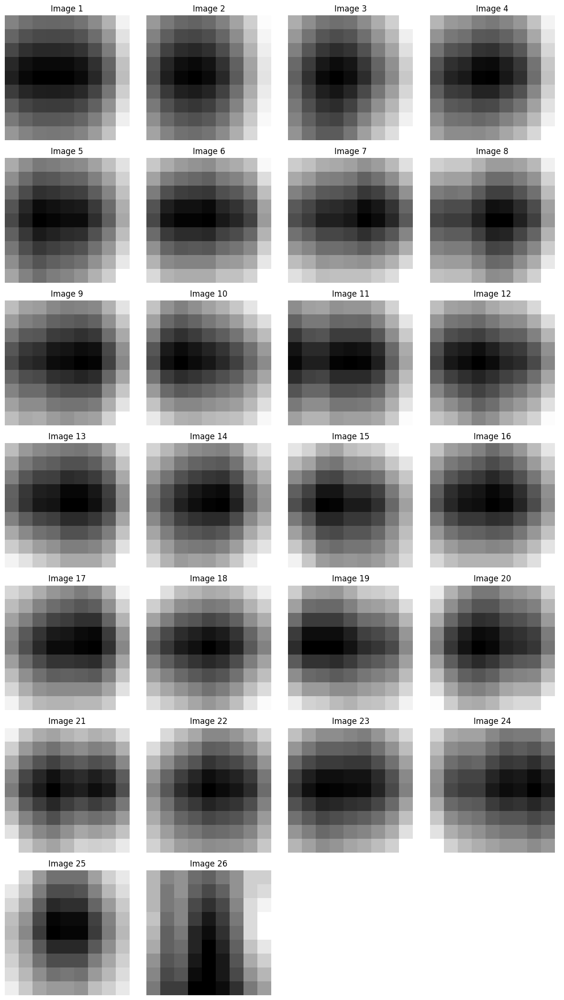

In [56]:
import tifffile
import matplotlib.pyplot as plt

# Specify the path to your TIFF file
tif_file_path = r"C:\Users\ASUS\Desktop\Msc Course\CT calibration\Dataset\AI images\120Kvp,429mAs,1s\Stack10.tif"

# Define how many images you want to display per row
images_per_row = 4

# Open the TIFF file using tifffile
try:
    with tifffile.TiffFile(tif_file_path) as tif:
        # Get the total number of images/pages in the TIFF file
        total_images = len(tif.pages)
        print(f"Total images in TIFF file: {total_images}")

        # Calculate the number of rows needed to display all images
        num_rows = np.ceil(total_images / images_per_row).astype(int)

        # Create subplots
        fig, axs = plt.subplots(num_rows, images_per_row, figsize=(3*images_per_row, 3*num_rows))
        axs = axs.flatten()  # Flatten the array of axes to simplify indexing
        
        # Iterate through each image/page in the TIFF file
        for i, page in enumerate(tif.pages):
            img = page.asarray()  # Convert the current page to an array
            
            # Display the image on its corresponding subplot
            axs[i].imshow(img, cmap='gray')
            axs[i].set_title(f"Image {i+1}")
            axs[i].axis('off')  # Hide axis ticks and labels
        
        # Hide any unused axes if the total number of images is not a perfect multiple of images_per_row
        for ax in axs[i+1:]:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
except Exception as e:
    print(f"Error opening TIFF file: {e}")
